<a href="https://colab.research.google.com/github/imyanuarginting/Recyclass/blob/Recyclass-Transfer-Learning/Jupyter%20Notebook/Recyclass%20using%20MobileNetV2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://github.com/imyanuarginting/Recyclass.git

Cloning into 'Recyclass'...
remote: Enumerating objects: 1668, done.
remote: Counting objects: 100% (30/30), done.
remote: Compressing objects: 100% (19/19), done.
remote: Total 1668 (delta 15), reused 11 (delta 11), pack-reused 1638
Receiving objects: 100% (1668/1668), 261.61 MiB | 28.78 MiB/s, done.
Resolving deltas: 100% (232/232), done.
Updating files: 100% (1059/1059), done.


In [ ]:
import os
import zipfile

zip_ref = zipfile.ZipFile('Recyclass/Recyclass.zip', 'r')
zip_ref.extractall("tmp/")
zip_ref.close()

base_dir = 'tmp/Recyclass'

In [ ]:
from pathlib import Path
import imghdr

In [ ]:
train_dir = os.path.join(base_dir, 'train')
image_extensions = ['.png', '.jpg']

img_type_accepted = ['jpeg', 'png', 'gif', 'bmp', 'jpg']
for filepath in Path(train_dir).rglob("*"):
  if filepath.suffix.lower() in image_extensions:
    img_type = imghdr.what(filepath)
    if img_type is None:
      print(f'{filepath} is not an image')
    elif img_type not in img_type_accepted:
      print(f'{filepath} is a {img_type}, not accepted by TensorFlow')

In [ ]:
val_dir = os.path.join(base_dir, 'val')
image_extensions = ['.png', '.jpg']

img_type_accepted = ['jpeg', 'png', 'gif', 'bmp', 'jpg']
for filepath in Path(val_dir).rglob("*"):
  if filepath.suffix.lower() in image_extensions:
    img_type = imghdr.what(filepath)
    if img_type is None:
      print(f'{filepath} is not an image')
    elif img_type not in img_type_accepted:
      print(f'{filepath} is a {img_type}, not accepted by TensorFlow')

In [ ]:
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')

In [ ]:
hdpe_train_dir = os.path.join(train_dir, 'hdpe')
ldpe_train_dir = os.path.join(train_dir, 'ldpe')
others_train_dir = os.path.join(train_dir, 'others')
pet_train_dir = os.path.join(train_dir, 'pet')
pp_train_dir = os.path.join(train_dir, 'pp')
ps_train_dir = os.path.join(train_dir, 'ps')
pvc_train_dir = os.path.join(train_dir, 'pvc')

In [ ]:
hdpe_val_dir = os.path.join(val_dir, 'hdpe')
ldpe_val_dir = os.path.join(val_dir, 'ldpe')
others_val_dir = os.path.join(val_dir, 'others')
pet_val_dir = os.path.join(val_dir, 'pet')
pp_val_dir = os.path.join(val_dir, 'pp')
ps_val_dir = os.path.join(val_dir, 'ps')
pvc_val_dir = os.path.join(val_dir, 'pvc')

In [ ]:
print('total training HDPE images:', len(os.listdir(hdpe_train_dir)))
print('total training LDPE images:', len(os.listdir(ldpe_train_dir)))
print('total training Others images:', len(os.listdir(others_train_dir)))
print('total training PET images:', len(os.listdir(pet_train_dir)))
print('total training PP images:', len(os.listdir(pp_train_dir)))
print('total training PS images:', len(os.listdir(ps_train_dir)))
print('total training PVC images:', len(os.listdir(pvc_train_dir)))

total training HDPE images: 105
total training LDPE images: 105
total training Others images: 105
total training PET images: 105
total training PP images: 105
total training PS images: 105
total training PVC images: 105


In [ ]:
print('total validation HDPE images:', len(os.listdir(hdpe_val_dir)))
print('total validation LDPE images:', len(os.listdir(ldpe_val_dir)))
print('total validation Others images:', len(os.listdir(others_val_dir)))
print('total validation PET images:', len(os.listdir(pet_val_dir)))
print('total validation PP images:', len(os.listdir(pp_val_dir)))
print('total validation PS images:', len(os.listdir(ps_val_dir)))
print('total validation PVC images:', len(os.listdir(pvc_val_dir)))

total validation HDPE images: 45
total validation LDPE images: 45
total validation Others images: 45
total validation PET images: 45
total validation PP images: 45
total validation PS images: 45
total validation PVC images: 45


In [ ]:
hdpe_train_files = os.listdir(hdpe_train_dir)
print(hdpe_train_files[:10])

ldpe_train_files = os.listdir(ldpe_train_dir)
print(ldpe_train_files[:10])

others_train_files = os.listdir(others_train_dir)
print(others_train_files[:10])

pet_train_files = os.listdir(pet_train_dir)
print(pet_train_files[:10])

pp_train_files = os.listdir(pp_train_dir)
print(pp_train_files[:10])

ps_train_files = os.listdir(ps_train_dir)
print(ps_train_files[:10])

pvc_train_files = os.listdir(pvc_train_dir)
print(pvc_train_files[:10])

['hdpe (126).jpg', 'hdpe (117).jpg', 'hdpe (93).jpg', 'hdpe (95).jpg', 'hdpe (46).jpg', 'hdpe (33).jpg', 'hdpe (114).jpg', 'hdpe (138).jpg', 'hdpe (137).jpg', 'hdpe (96).jpg']
['ldpe (40).jpg', 'ldpe (10).jpg', 'ldpe (120).jpg', 'ldpe (112).jpg', 'ldpe (127).jpg', 'ldpe (48).jpg', 'ldpe (76).jpg', 'ldpe (145).jpg', 'ldpe (122).jpg', 'ldpe (134).jpg']
['others (82).jpg', 'others (121).jpg', 'others (84).jpg', 'others (54).jpg', 'others (104).jpg', 'others (44).jpg', 'others (8).jpg', 'others (4).jpg', 'others (125).jpg', 'others (137).jpg']
['pet (52).jpg', 'pet (90).jpg', 'pet (86).jpg', 'pet (60).jpg', 'pet (36).jpg', 'pet (145).jpg', 'pet (48).jpg', 'pet (30).jpg', 'pet (64).jpg', 'pet (147).jpg']
['pp (99).jpg', 'pp (66).jpg', 'pp (40).jpg', 'pp (145).jpg', 'pp (90).jpg', 'pp (58).jpg', 'pp (109).jpg', 'pp (22).jpg', 'pp (96).jpg', 'pp (38).jpg']
['ps (64).jpg', 'ps (80).jpg', 'ps (132).jpg', 'ps (130).jpg', 'ps (91).jpg', 'ps (50).jpg', 'ps (78).jpg', 'ps (88).jpg', 'ps (146).jpg',

In [ ]:
hdpe_val_files = os.listdir(hdpe_val_dir)
print(hdpe_val_files[:10])

ldpe_val_files = os.listdir(ldpe_val_dir)
print(ldpe_val_files[:10])

others_val_files = os.listdir(others_val_dir)
print(others_val_files[:10])

pet_val_files = os.listdir(pet_val_dir)
print(pet_val_files[:10])

pp_val_files = os.listdir(pp_val_dir)
print(pp_val_files[:10])

ps_val_files = os.listdir(ps_val_dir)
print(ps_val_files[:10])

pvc_val_files = os.listdir(pvc_val_dir)
print(pvc_val_files[:10])

['hdpe (18).jpg', 'hdpe (54).jpg', 'hdpe (85).jpg', 'hdpe (14).jpg', 'hdpe (52).jpg', 'hdpe (3).jpg', 'hdpe (87).jpg', 'hdpe (5).jpg', 'hdpe (7).jpg', 'hdpe (21).jpg']
['ldpe (57).jpg', 'ldpe (81).jpg', 'ldpe (31).jpg', 'ldpe (27).jpg', 'ldpe (21).jpg', 'ldpe (7).jpg', 'ldpe (1).jpg', 'ldpe (69).jpg', 'ldpe (65).jpg', 'ldpe (37).jpg']
['others (9).jpg', 'others (15).jpg', 'others (19).jpg', 'others (71).jpg', 'others (33).jpg', 'others (27).jpg', 'others (3).jpg', 'others (7).jpg', 'others (83).jpg', 'others (69).jpg']
['pet (65).jpg', 'pet (19).jpg', 'pet (53).jpg', 'pet (55).jpg', 'pet (45).jpg', 'pet (89).jpg', 'pet (47).jpg', 'pet (59).jpg', 'pet (13).jpg', 'pet (15).jpg']
['pp (3).jpg', 'pp (144).jpg', 'pp (11).jpg', 'pp (19).jpg', 'pp (49).jpg', 'pp (9).jpg', 'pp (124).jpg', 'pp (15).jpg', 'pp (17).jpg', 'pp (7).jpg']
['ps (33).jpg', 'ps (17).jpg', 'ps (31).jpg', 'ps (75).jpg', 'ps (57).jpg', 'ps (15).jpg', 'ps (63).jpg', 'ps (1).jpg', 'ps (41).jpg', 'ps (11).jpg']
['pvc (1).jpg'

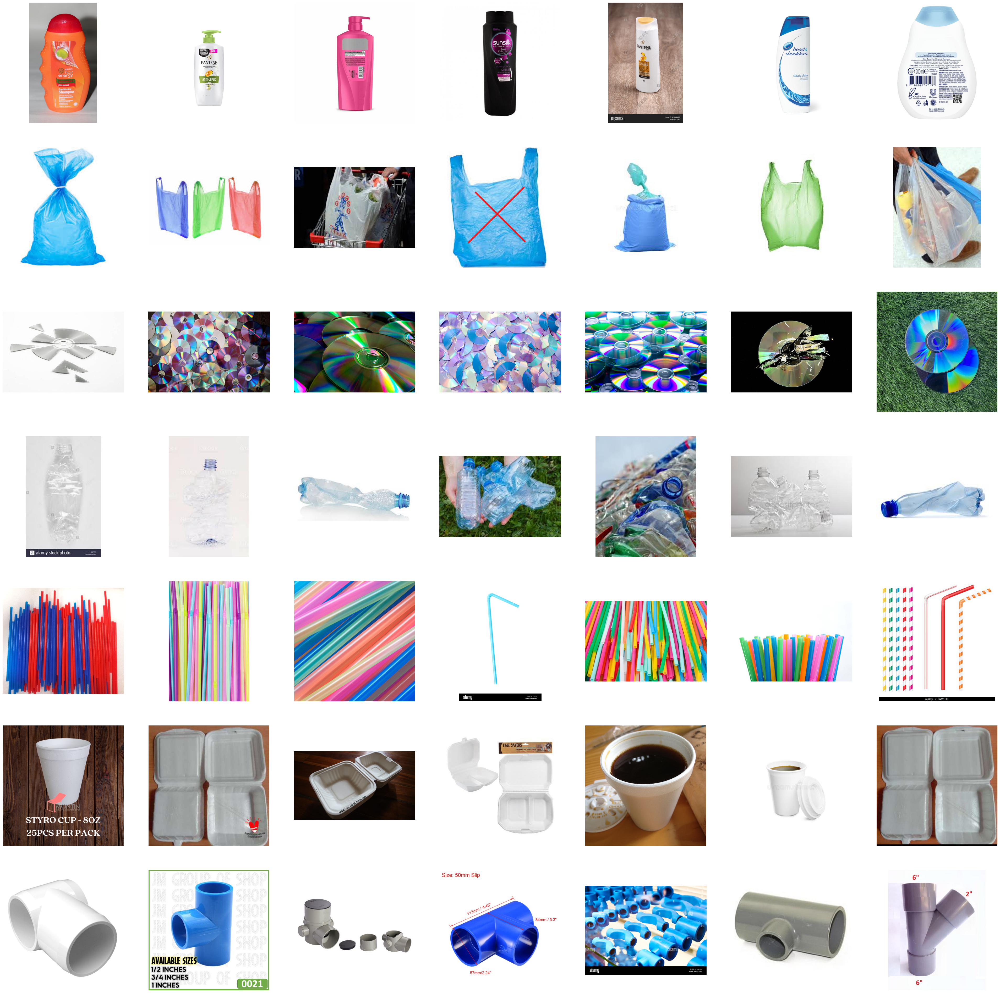

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

nrows = 7
ncols = 7

pic_index = 0

fig = plt.gcf()
fig.set_size_inches(ncols * 7, nrows * 7)

pic_index += 7
hdpe = [os.path.join(hdpe_train_dir, fname)
          for fname in hdpe_train_files[pic_index-7:pic_index]]
ldpe = [os.path.join(ldpe_train_dir, fname)
          for fname in ldpe_train_files[pic_index-7:pic_index]]
others = [os.path.join(others_train_dir, fname)
          for fname in others_train_files[pic_index-7:pic_index]]
pet = [os.path.join(pet_train_dir, fname)
          for fname in pet_train_files[pic_index-7:pic_index]]
pp = [os.path.join(pp_train_dir, fname)
          for fname in pp_train_files[pic_index-7:pic_index]]
ps = [os.path.join(ps_train_dir, fname)
          for fname in ps_train_files[pic_index-7:pic_index]]
pvc = [os.path.join(pvc_train_dir, fname)
          for fname in pvc_train_files[pic_index-7:pic_index]]

for i, img_path in enumerate(hdpe + ldpe + others + pet + pp + ps + pvc):
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off')

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

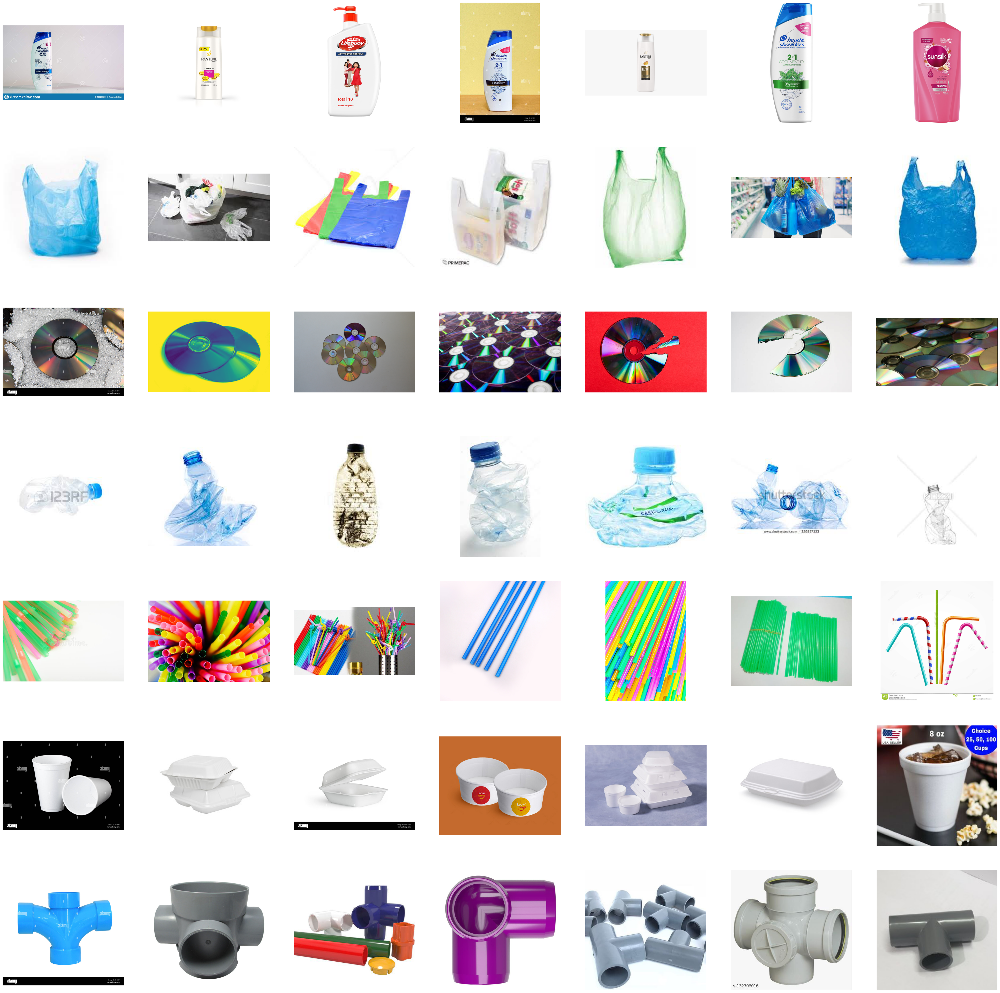

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

nrows = 7
ncols = 7

pic_index = 0

fig = plt.gcf()
fig.set_size_inches(ncols * 7, nrows * 7)

pic_index += 7
hdpe = [os.path.join(hdpe_val_dir, fname)
          for fname in hdpe_val_files[pic_index-7:pic_index]]
ldpe = [os.path.join(ldpe_val_dir, fname)
          for fname in ldpe_val_files[pic_index-7:pic_index]]
others = [os.path.join(others_val_dir, fname)
          for fname in others_val_files[pic_index-7:pic_index]]
pet = [os.path.join(pet_val_dir, fname)
          for fname in pet_val_files[pic_index-7:pic_index]]
pp = [os.path.join(pp_val_dir, fname)
          for fname in pp_val_files[pic_index-7:pic_index]]
ps = [os.path.join(ps_val_dir, fname)
          for fname in ps_val_files[pic_index-7:pic_index]]
pvc = [os.path.join(pvc_val_dir, fname)
          for fname in pvc_val_files[pic_index-7:pic_index]]

for i, img_path in enumerate(hdpe + ldpe + others + pet + pp + ps + pvc):
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off')

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

In [ ]:
from tensorflow.keras.applications import MobileNetV2

base_model = MobileNetV2(weights='imagenet',
                       include_top=False,
                       input_shape=(224, 224, 3))

base_model.trainable = False

base_model.summary()

9406464/9406464 [==============================] - 0s 0us/step
Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                

In [ ]:
DENSE_LAYER = 32
DROPOUT_LAYER = 0.1

In [ ]:
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras import layers

model = Sequential([
    layers.Rescaling(1.0/255.0, input_shape=(224, 224, 3)),
    layers.RandomFlip(mode='horizontal'),
    base_model,
    layers.Flatten(),
    layers.Dense(DENSE_LAYER, activation='relu'),
    layers.Dropout(DROPOUT_LAYER),
    layers.Dense(7, activation='softmax')
])

model.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_7 (Rescaling)     (None, 224, 224, 3)       0         
                                                                 
 random_flip_7 (RandomFlip)  (None, 224, 224, 3)       0         
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 7, 7, 1280)       2257984   
 ional)                                                          
                                                                 
 flatten_7 (Flatten)         (None, 62720)             0         
                                                                 
 dense_14 (Dense)            (None, 32)                2007072   
                                                                 
 dropout_11 (Dropout)        (None, 32)                0         
                                                      

In [ ]:
from tensorflow.keras.optimizers import Adam

model.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
BATCH_SIZE = 16
IMAGE_SIZE = (224, 224)

In [ ]:
from tensorflow.keras.utils import image_dataset_from_directory

train = image_dataset_from_directory(
    directory=train_dir,
    label_mode='categorical',
    color_mode='rgb',
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    shuffle=True,
    seed=42)

val = image_dataset_from_directory(
    directory=val_dir,
    label_mode='categorical',
    color_mode='rgb',
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    shuffle=False)

Found 735 files belonging to 7 classes.
Found 315 files belonging to 7 classes.


In [ ]:
history = model.fit(
    train,
    validation_data=val,
    epochs=10,
    verbose=2)

Epoch 1/10
46/46 - 55s - loss: 1.0571 - accuracy: 0.7769 - val_loss: 0.2325 - val_accuracy: 0.9175 - 55s/epoch - 1s/step
Epoch 2/10
46/46 - 51s - loss: 0.2735 - accuracy: 0.9224 - val_loss: 0.1174 - val_accuracy: 0.9683 - 51s/epoch - 1s/step
Epoch 3/10
46/46 - 51s - loss: 0.1644 - accuracy: 0.9429 - val_loss: 0.0639 - val_accuracy: 0.9714 - 51s/epoch - 1s/step
Epoch 4/10
46/46 - 51s - loss: 0.1218 - accuracy: 0.9687 - val_loss: 0.0940 - val_accuracy: 0.9778 - 51s/epoch - 1s/step
Epoch 5/10
46/46 - 51s - loss: 0.1539 - accuracy: 0.9565 - val_loss: 0.1236 - val_accuracy: 0.9619 - 51s/epoch - 1s/step
Epoch 6/10
46/46 - 51s - loss: 0.1668 - accuracy: 0.9605 - val_loss: 0.0884 - val_accuracy: 0.9746 - 51s/epoch - 1s/step
Epoch 7/10
46/46 - 52s - loss: 0.1682 - accuracy: 0.9701 - val_loss: 0.1822 - val_accuracy: 0.9619 - 52s/epoch - 1s/step
Epoch 8/10
46/46 - 43s - loss: 0.1108 - accuracy: 0.9592 - val_loss: 0.2815 - val_accuracy: 0.9429 - 43s/epoch - 928ms/step
Epoch 9/10
46/46 - 50s - loss

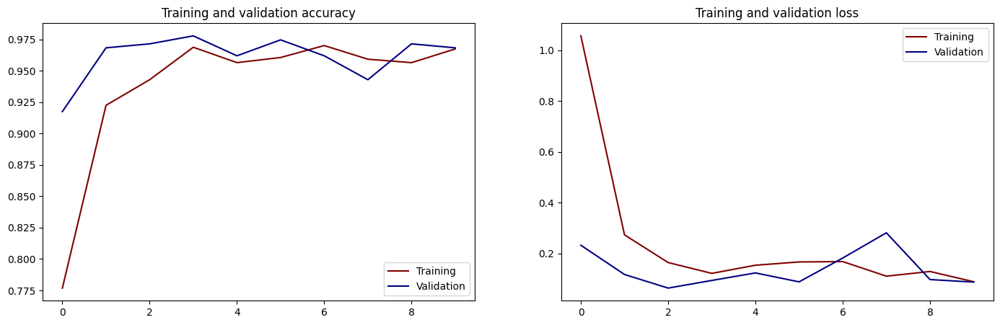

In [ ]:
import matplotlib.pyplot as plt

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_acc = range(len(acc))
epochs_loss = range(len(loss))

fig, (acc_fig, loss_fig) = plt.subplots(1, 2, figsize=(17, 5))

acc_fig.plot(epochs_acc, acc, '#800000', label='Training accuracy')
acc_fig.plot(epochs_acc, val_acc, '#000080', label='Validation accuracy')
acc_fig.set_title('Training and validation accuracy')
acc_fig.legend(["Training", "Validation"], loc ="lower right")

loss_fig.plot(epochs_loss, loss, '#800000', label='Training loss')
loss_fig.plot(epochs_loss, val_loss, '#000080', label='Validation loss')
loss_fig.set_title('Training and validation loss')
loss_fig.legend(["Training", "Validation"], loc ="upper right")

plt.show()

In [ ]:
import numpy as np
from google.colab import files
from tensorflow.keras.utils import load_img, img_to_array

uploaded = files.upload()

for fn in uploaded.keys():

  path = fn
  img = load_img(path, target_size=(224, 224))
  x = img_to_array(img)
  x = np.expand_dims(x, axis=0)

  images = np.vstack([x])
  classes = model.predict(images, batch_size=8)
  print(fn)

  print('HDPE', '{:.5f}'.format(classes[0, 0]))
  print('LDPE', '{:.5f}'.format(classes[0, 1]))
  print('Others', '{:.5f}'.format(classes[0, 2]))
  print('PET', '{:.5f}'.format(classes[0, 3]))
  print('PP', '{:.5f}'.format(classes[0, 4]))
  print('PS', '{:.5f}'.format(classes[0, 5]))
  print('PVC', '{:.5f}'.format(classes[0, 6]))

Saving pvc (19).jpg to pvc (19).jpg
1/1 [==============================] - 0s 95ms/step
pvc (19).jpg
HDPE 0.00000
LDPE 0.00001
Others 0.00000
PET 0.00000
PP 0.00004
PS 0.00000
PVC 0.99995


In [ ]:
model.save('Recyclass using MobileNetV2.h5')

In [ ]:
from tensorflow import keras

model_path = 'drive/MyDrive/Recyclass/Recyclass using MobileNetV2.h5'
model = keras.models.load_model(model_path)

In [ ]:
import numpy as np
from google.colab import files
from tensorflow.keras.utils import load_img, img_to_array

uploaded = files.upload()

for fn in uploaded.keys():

  path = fn
  img = load_img(path, target_size=(224, 224))
  x = img_to_array(img)
  x = np.expand_dims(x, axis=0)

  images = np.vstack([x])
  classes = model.predict(images, batch_size=8)
  print(fn)

  print('HDPE', '{:.5f}'.format(classes[0, 0]))
  print('LDPE', '{:.5f}'.format(classes[0, 1]))
  print('Others', '{:.5f}'.format(classes[0, 2]))
  print('PET', '{:.5f}'.format(classes[0, 3]))
  print('PP', '{:.5f}'.format(classes[0, 4]))
  print('PS', '{:.5f}'.format(classes[0, 5]))
  print('PVC', '{:.5f}'.format(classes[0, 6]))

Saving hdpe (1).jpg to hdpe (1) (1).jpg
1/1 [==============================] - 0s 62ms/step
hdpe (1).jpg
HDPE 0.99982
LDPE 0.00006
Others 0.00009
PET 0.00000
PP 0.00000
PS 0.00001
PVC 0.00003


In [ ]:
!pip install tensorflowjs

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.1/85.1 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 189.9/189.9 kB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 62.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.9/40.9 kB 5.7 MB/s eta 0:00:00
  Attempting uninstall: packaging
    Found existing installation: packaging 23.1
    Uninstalling packaging-23.1:
      Successfully uninstalled packaging-23.1
  Attempting uninstall: flax
    Found existing installation: flax 0.6.9
    Uninstalling flax-0.6.9:
      Successfully uninstalled flax-0.6.9
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
statsmodels 0.13.5 requires packaging>=21.3, but you have packaging 20.9 which is incompatible.
xar

In [ ]:
import tensorflowjs as tfjs

output_dir = 'tensorflowjs'
tfjs.converters.save_keras_model(model, output_dir)

In [ ]:
from tensorflow import lite

converter = lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

with open('model.tflite', 'wb') as f:
    f.write(tflite_model)

label = ['hdpe', 'ldpe', 'others', 'pet', 'pp', 'ps', 'pvc']

with open('label.txt', 'w') as f:
    f.write('\n'.join(label))